# Customer Segmentation via K-Means Clustering with KPCA



Clustering algorithm is a commercial approach that facilitates customer segmentation, which is the classification of related clients into the same segment. The clustering technique facilitates a deeper comprehension of clients, both in terms of their static demographics and their dynamic behaviors. Customers with similar attributes frequently interact with a business in a similar manner; therefore, businesses can benefit from this technique by developing segment-specific marketing strategies. On this basis, clients may be offered discounts, specials, and promotional coupons, among other incentives.  Does it make sense to examine the specifics of each individual consumer before reaching a conclusion? Here, rather than developing unique strategies for each customer, companies are required to create simple plans. This will lower both the work and the time required. Clustering is the process of grouping all the data into groups (also called clusters) based on patterns in the data. seeing values and modifying their residual deviations.

In the coming decade, banking industry competition will intensify. One of this industry's primary sources of revenue is Interest Income, which they could earn by providing customers with loan or credit payment services. Consequently, the more credit extended, the more the interest accrued. Since every credit activity gathers data, the company hopes that by processing the data they might gain insight. This report offers a summary of the usage patterns of about 9000 active credit card members during the past six months. Data covers transaction frequency, amount, tenure… etc. The bank's marketing department would like to use AI/ML to launch a marketing campaign that is specifically suited to a subset of clients. To ensure the effectiveness of this campaign, the bank must divide its customers into at least three distinct categories. This procedure is known as "marketing segmentation" and is essential for maximizing the conversion rate of marketing campaigns. We will process this data using unsupervised learning methodology to segment the customers by identifying a pattern in the hopes of discovering a feature shared by each group. Afterwards, we can examine each segment and develop the optimal marketing strategy for each segment.

With our data, we will conduct exploratory data analysis before employing a range of basic to complex dimensionality reduction techniques. We will employ unsupervised methods to reduce the dimensionality of the data, visualize the resulting two-dimensional data, and evaluate what our models are learning. Finally, we will depict our clusters in an interactive method in order to evaluate their similarities and differences in greater depth.


In [639]:
import pandas as pd
import numpy as np

import matplotlib
import matplotlib.pyplot as plt
from matplotlib import colors
import seaborn as sns
from mpl_toolkits.mplot3d import Axes3D

from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import KernelPCA
from sklearn.cluster import KMeans

from sklearn.metrics import silhouette_samples, silhouette_score

from yellowbrick.cluster import KElbowVisualizer

In [730]:
data=pd.read_csv("Customer Dataset.csv")

In [731]:
df=data.head(1000)
df

,CUST_ID,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,C10001,40.900749,0.818182,95.40,0.00,95.40,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12
1,C10002,3202.467416,0.909091,0.00,0.00,0.00,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12
2,C10003,2495.148862,1.000000,773.17,773.17,0.00,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12
3,C10004,1666.670542,0.636364,1499.00,1499.00,0.00,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,NaN,0.000000,12
4,C10005,817.714335,1.000000,16.00,16.00,0.00,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,C11029,1250.394614,0.909091,443.99,443.99,0.00,0.000000,0.272727,0.272727,0.000000,0.000000,0,3,3500.0,273.823646,259.715939,0.000000,11
996,C11030,9.503968,1.000000,96.62,0.00,96.62,0.000000,1.000000,0.000000,1.000000,0.000000,0,19,4500.0,1086.932525,92.217936,0.250000,12
997,C11031,2285.068731,1.000000,0.00,0.00,0.00,1173.310874,0.000000,0.000000,0.000000,0.166667,5,0,2500.0,381.672065,1003.265207,0.000000,12
998,C11032,2928.756699,1.000000,160.92,0.00,160.92,319.931964,1.000000,0.000000,1.000000,0.333333,5,12,3000.0,1142.847203,1098.479834,0.000000,12


In [732]:
df.isnull().sum()

CUST_ID                              0
BALANCE                              0
BALANCE_FREQUENCY                    0
PURCHASES                            0
ONEOFF_PURCHASES                     0
INSTALLMENTS_PURCHASES               0
CASH_ADVANCE                         0
PURCHASES_FREQUENCY                  0
ONEOFF_PURCHASES_FREQUENCY           0
PURCHASES_INSTALLMENTS_FREQUENCY     0
CASH_ADVANCE_FREQUENCY               0
CASH_ADVANCE_TRX                     0
PURCHASES_TRX                        0
CREDIT_LIMIT                         0
PAYMENTS                             0
MINIMUM_PAYMENTS                    74
PRC_FULL_PAYMENT                     0
TENURE                               0
dtype: int64

In [733]:
df["MINIMUM_PAYMENTS"]=df["MINIMUM_PAYMENTS"].fillna(df["MINIMUM_PAYMENTS"].median())
df.head(5)

C:\Users\ARCHITECTURE\AppData\Local\Temp\ipykernel_25468\1876977846.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["MINIMUM_PAYMENTS"]=df["MINIMUM_PAYMENTS"].fillna(df["MINIMUM_PAYMENTS"].median())


,CUST_ID,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,C10001,40.900749,0.818182,95.40,0.00,95.4,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12
1,C10002,3202.467416,0.909091,0.00,0.00,0.0,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12
2,C10003,2495.148862,1.000000,773.17,773.17,0.0,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12
3,C10004,1666.670542,0.636364,1499.00,1499.00,0.0,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,528.791003,0.000000,12
4,C10005,817.714335,1.000000,16.00,16.00,0.0,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12


In [734]:
df.isnull().sum()

CUST_ID                             0
BALANCE                             0
BALANCE_FREQUENCY                   0
PURCHASES                           0
ONEOFF_PURCHASES                    0
INSTALLMENTS_PURCHASES              0
CASH_ADVANCE                        0
PURCHASES_FREQUENCY                 0
ONEOFF_PURCHASES_FREQUENCY          0
PURCHASES_INSTALLMENTS_FREQUENCY    0
CASH_ADVANCE_FREQUENCY              0
CASH_ADVANCE_TRX                    0
PURCHASES_TRX                       0
CREDIT_LIMIT                        0
PAYMENTS                            0
MINIMUM_PAYMENTS                    0
PRC_FULL_PAYMENT                    0
TENURE                              0
dtype: int64

In [735]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 18 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   CUST_ID                           1000 non-null   object 
 1   BALANCE                           1000 non-null   float64
 2   BALANCE_FREQUENCY                 1000 non-null   float64
 3   PURCHASES                         1000 non-null   float64
 4   ONEOFF_PURCHASES                  1000 non-null   float64
 5   INSTALLMENTS_PURCHASES            1000 non-null   float64
 6   CASH_ADVANCE                      1000 non-null   float64
 7   PURCHASES_FREQUENCY               1000 non-null   float64
 8   ONEOFF_PURCHASES_FREQUENCY        1000 non-null   float64
 9   PURCHASES_INSTALLMENTS_FREQUENCY  1000 non-null   float64
 10  CASH_ADVANCE_FREQUENCY            1000 non-null   float64
 11  CASH_ADVANCE_TRX                  1000 non-null   int64  
 12  PURCHAS

In [736]:
df.describe()

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
count,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000
mean,2412.351396,0.906538,1652.230370,1054.210390,598.205220,1316.397606,0.521547,0.269678,0.376170,0.142861,3.500000,19.645000,6313.750000,2570.649055,1240.260248,0.129782,11.713000
std,2795.390979,0.210538,3524.515043,2819.795174,1272.592078,2730.477215,0.406850,0.335454,0.407137,0.208752,7.647122,31.294669,4576.527947,4251.971043,2617.890376,0.278915,1.016693
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,500.000000,0.000000,8.561540,0.000000,6.000000
25%,356.519939,1.000000,70.802500,0.000000,0.000000,0.000000,0.083333,0.000000,0.000000,0.000000,0.000000,1.000000,2500.000000,502.218305,207.102535,0.000000,12.000000
50%,1464.258056,1.000000,564.445000,195.680000,100.000000,0.000000,0.500000,0.083333,0.166667,0.000000,0.000000,9.000000,5000.000000,1236.370865,528.791003,0.000000,12.000000
75%,3421.553831,1.000000,1703.477500,1030.047500,688.080000,1623.252433,1.000000,0.416667,0.833333,0.250000,4.000000,24.000000,9000.000000,2841.838133,1296.025496,0.083333,12.000000
max,19043.138560,1.000000,49039.570000,40761.250000,12560.850000,27296.485760,1.000000,1.000000,1.000000,1.250000,123.000000,229.000000,28000.000000,46930.598240,38512.124770,1.000000,12.000000


In [737]:
df.drop(["CUST_ID"], axis=1, inplace=True)
df.head()

C:\Users\ARCHITECTURE\AppData\Local\Temp\ipykernel_25468\3069019966.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(["CUST_ID"], axis=1, inplace=True)


,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,40.900749,0.818182,95.40,0.00,95.4,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12
1,3202.467416,0.909091,0.00,0.00,0.0,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12
2,2495.148862,1.000000,773.17,773.17,0.0,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12
3,1666.670542,0.636364,1499.00,1499.00,0.0,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,528.791003,0.000000,12
4,817.714335,1.000000,16.00,16.00,0.0,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12


In [738]:
df['Monthly_avg_purchase']=df['PURCHASES']/df['TENURE']
df['Monthly_cash_advance']=df['CASH_ADVANCE']/df['TENURE']
df['limit_usage']=df.apply(lambda x: x['BALANCE']/x['CREDIT_LIMIT'], axis=1)
df['payment_minpay']=df.apply(lambda x:x['PAYMENTS']/x['MINIMUM_PAYMENTS'],axis=1)

C:\Users\ARCHITECTURE\AppData\Local\Temp\ipykernel_25468\2292893385.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Monthly_avg_purchase']=df['PURCHASES']/df['TENURE']
C:\Users\ARCHITECTURE\AppData\Local\Temp\ipykernel_25468\2292893385.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Monthly_cash_advance']=df['CASH_ADVANCE']/df['TENURE']
C:\Users\ARCHITECTURE\AppData\Local\Temp\ipykernel_25468\2292893385.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a Da

In [739]:
def purchase(df):
    if (df['ONEOFF_PURCHASES']==0) & (df['INSTALLMENTS_PURCHASES']==0):
        return 'none'
    if (df['ONEOFF_PURCHASES']>0) & (df['INSTALLMENTS_PURCHASES']>0):
         return 'both_oneoff_installment'
    if (df['ONEOFF_PURCHASES']>0) & (df['INSTALLMENTS_PURCHASES']==0):
        return 'one_off'
    if (df['ONEOFF_PURCHASES']==0) & (df['INSTALLMENTS_PURCHASES']>0):
        return 'installment'

In [740]:
df['purchase_type']=df.apply(purchase,axis=1)

C:\Users\ARCHITECTURE\AppData\Local\Temp\ipykernel_25468\3712931265.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['purchase_type']=df.apply(purchase,axis=1)


In [741]:
df.head()

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,...,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE,Monthly_avg_purchase,Monthly_cash_advance,limit_usage,payment_minpay,purchase_type
0,40.900749,0.818182,95.40,0.00,95.4,0.000000,0.166667,0.000000,0.083333,0.000000,...,1000.0,201.802084,139.509787,0.000000,12,7.950000,0.000000,0.040901,1.446508,installment
1,3202.467416,0.909091,0.00,0.00,0.0,6442.945483,0.000000,0.000000,0.000000,0.250000,...,7000.0,4103.032597,1072.340217,0.222222,12,0.000000,536.912124,0.457495,3.826241,none
2,2495.148862,1.000000,773.17,773.17,0.0,0.000000,1.000000,1.000000,0.000000,0.000000,...,7500.0,622.066742,627.284787,0.000000,12,64.430833,0.000000,0.332687,0.991682,one_off
3,1666.670542,0.636364,1499.00,1499.00,0.0,205.788017,0.083333,0.083333,0.000000,0.083333,...,7500.0,0.000000,528.791003,0.000000,12,124.916667,17.149001,0.222223,0.000000,one_off
4,817.714335,1.000000,16.00,16.00,0.0,0.000000,0.083333,0.083333,0.000000,0.000000,...,1200.0,678.334763,244.791237,0.000000,12,1.333333,0.000000,0.681429,2.771075,one_off


Text(0.5, 1.0, 'Mean payment and minimum payment ratio for each purchse type')

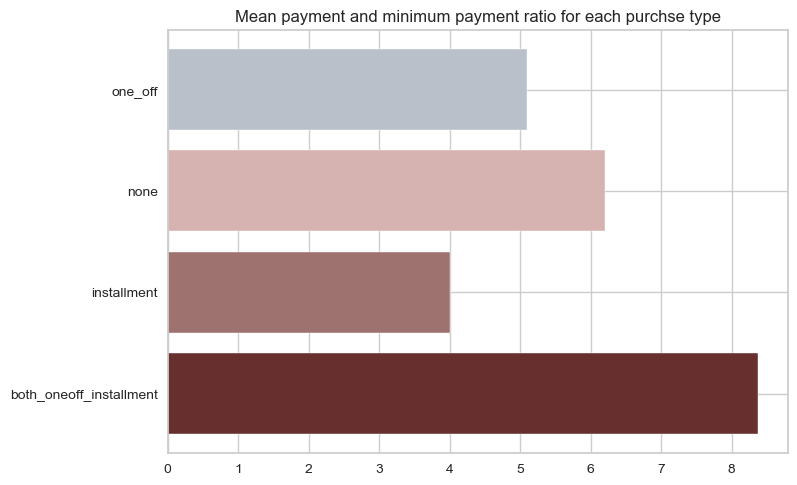

In [742]:
x=df.groupby('purchase_type').apply(lambda x: np.mean(x['payment_minpay']))

fig,ax=plt.subplots()
ax.barh(y=range(len(x)), width=x.values, align='center', color=("#682F2F", "#9E726F", "#D6B2B1", "#B9C0C9", "#9F8A78", "#F3AB60", "#CFBA5F"))
ax.set(yticks= np.arange(len(x)),yticklabels = x.index);
plt.title('Mean payment and minimum payment ratio for each purchse type')

In [743]:
df=pd.concat([df,pd.get_dummies(df['purchase_type'])],axis=1)
df=df.drop(['purchase_type'],axis=1)

df

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,...,PRC_FULL_PAYMENT,TENURE,Monthly_avg_purchase,Monthly_cash_advance,limit_usage,payment_minpay,both_oneoff_installment,installment,none,one_off
0,40.900749,0.818182,95.40,0.00,95.40,0.000000,0.166667,0.000000,0.083333,0.000000,...,0.000000,12,7.950000,0.000000,0.040901,1.446508,0,1,0,0
1,3202.467416,0.909091,0.00,0.00,0.00,6442.945483,0.000000,0.000000,0.000000,0.250000,...,0.222222,12,0.000000,536.912124,0.457495,3.826241,0,0,1,0
2,2495.148862,1.000000,773.17,773.17,0.00,0.000000,1.000000,1.000000,0.000000,0.000000,...,0.000000,12,64.430833,0.000000,0.332687,0.991682,0,0,0,1
3,1666.670542,0.636364,1499.00,1499.00,0.00,205.788017,0.083333,0.083333,0.000000,0.083333,...,0.000000,12,124.916667,17.149001,0.222223,0.000000,0,0,0,1
4,817.714335,1.000000,16.00,16.00,0.00,0.000000,0.083333,0.083333,0.000000,0.000000,...,0.000000,12,1.333333,0.000000,0.681429,2.771075,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,1250.394614,0.909091,443.99,443.99,0.00,0.000000,0.272727,0.272727,0.000000,0.000000,...,0.000000,11,40.362727,0.000000,0.357256,1.054320,0,0,0,1
996,9.503968,1.000000,96.62,0.00,96.62,0.000000,1.000000,0.000000,1.000000,0.000000,...,0.250000,12,8.051667,0.000000,0.002112,11.786563,0,1,0,0
997,2285.068731,1.000000,0.00,0.00,0.00,1173.310874,0.000000,0.000000,0.000000,0.166667,...,0.000000,12,0.000000,97.775906,0.914027,0.380430,0,0,1,0
998,2928.756699,1.000000,160.92,0.00,160.92,319.931964,1.000000,0.000000,1.000000,0.333333,...,0.000000,12,13.410000,26.660997,0.976252,1.040390,0,1,0,0


<Figure size 800x550 with 0 Axes>

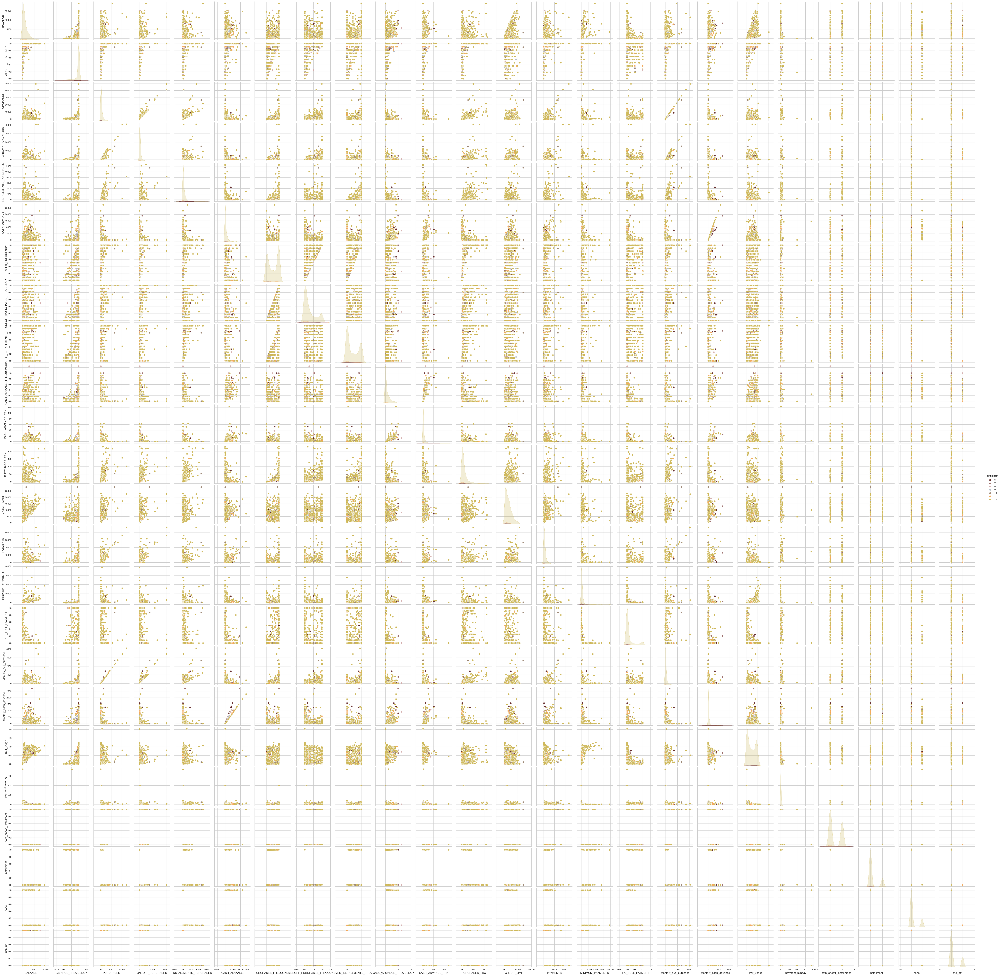

In [744]:
sns.set_style("whitegrid")

pallet = ["#682F2F", "#9E726F", "#D6B2B1", "#B9C0C9", "#9F8A78", "#F3AB60", "#CFBA5F"]

plt.figure()
sns.pairplot(df, hue="TENURE", palette=pallet)

plt.show()

In [745]:
#Dropping the outliers. 
length=len(df)

df = df[(df['CASH_ADVANCE_TRX']<120)]
df = df[(df['PURCHASES']<40000)]
df = df[(df['ONEOFF_PURCHASES']<40000)]
df = df[(df['INSTALLMENTS_PURCHASES']<12000)]
df = df[(df['CASH_ADVANCE']<20000)]
df = df[(df['MINIMUM_PAYMENTS']<30000)]

print("The number of data-points removed the outliers is:", (length-len(df)))

The number of data-points removed the outliers is: 8


<Axes: >

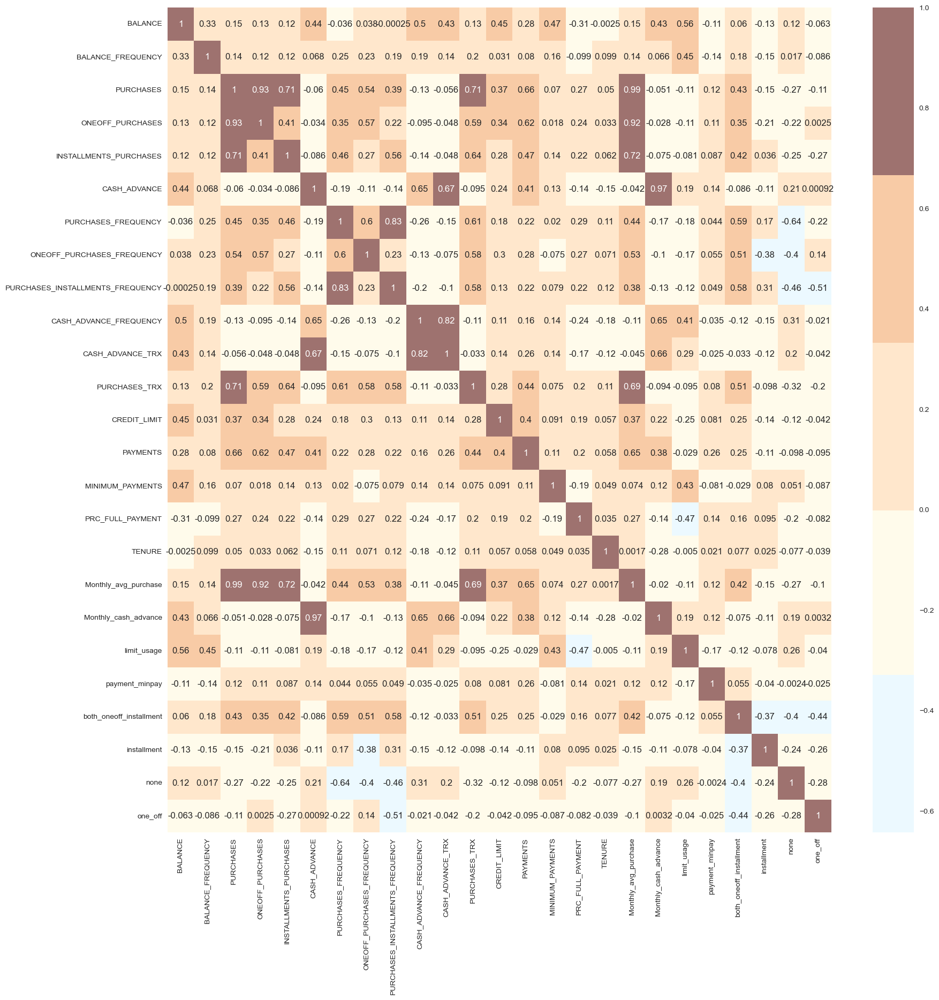

In [746]:
#correlation matrix
sns.set_style("whitegrid")

cmap = colors.ListedColormap(["#D6B2B1", "#ECF9FF", "#FFFBEB", "#FFE7CC", "#F8CBA6", "#9E726F"])

corrmat= df.corr()
plt.figure(figsize=(20,20))  
sns.heatmap(corrmat, annot=True, cmap=cmap, center=0)

In [747]:
data = df.to_numpy().astype('float32')

In [748]:
scaler=StandardScaler()
scaled_data=scaler.fit_transform(data)
scaled_data[:, 0].std()

1.0

In [749]:
np.save("Data/training_data.npy", scaled_data)

In [750]:
kpca=KernelPCA(n_components=3, kernel="cosine")
res_kpca_cos=kpca.fit_transform(scaled_data)
res_kpca_cos

array([[-0.2504837 , -0.64735264, -0.4223378 ],
       [-0.654876  ,  0.36840206, -0.05006579],
       [ 0.0944409 , -0.24724849,  0.6621339 ],
       ...,
       [-0.7819222 ,  0.15938254, -0.24636671],
       [ 0.01947473,  0.13889356, -0.674965  ],
       [ 0.47915304,  0.11939118, -0.4100848 ]], dtype=float32)

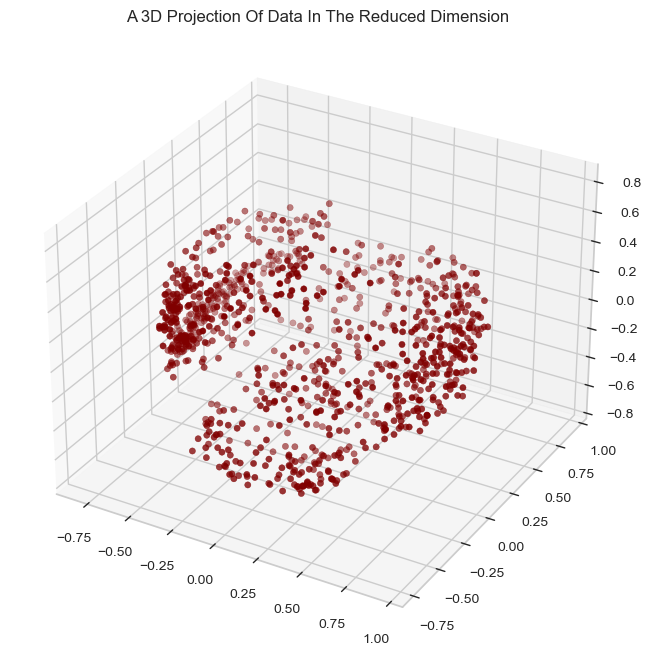

In [751]:
#A 3D Projection Of Data In The Reduced Dimension
x = res_kpca_cos[:, 0]
y = res_kpca_cos[:, 1]
z = res_kpca_cos[:, 2]

sns.set_style("whitegrid")
fig = plt.figure(figsize=(10,8))
ax = fig.add_subplot(111, projection="3d")
ax.scatter(x,y,z, c="maroon", marker="o" )
ax.set_title("A 3D Projection Of Data In The Reduced Dimension")
plt.show()

c:\Users\ARCHITECTURE\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
c:\Users\ARCHITECTURE\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=4.
  warnings.warn(
c:\Users\ARCHITECTURE\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
c:\Users\ARCHITECTURE\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid

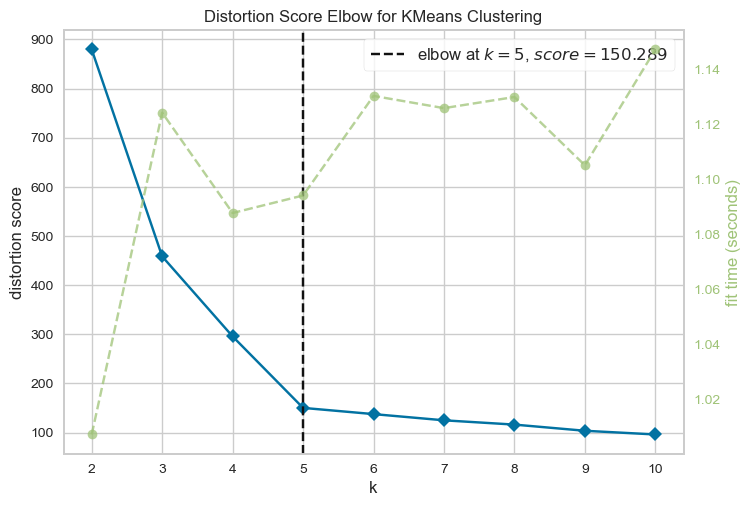

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [752]:
# Quick examination of elbow method to find numbers of clusters to make.

Elbow_M = KElbowVisualizer(KMeans(), k=10)
Elbow_M.fit(kpca_df)
Elbow_M.show()

In [753]:
clusterer=KMeans(n_clusters=5, random_state=123)
clusters=clusterer.fit_predict(kpca_df)

c:\Users\ARCHITECTURE\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
c:\Users\ARCHITECTURE\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=4.
  warnings.warn(


In [754]:
kpca_df["Clusters"] = clusters
#Adding the Clusters feature to the orignal dataframe.
df["Clusters"]= clusters

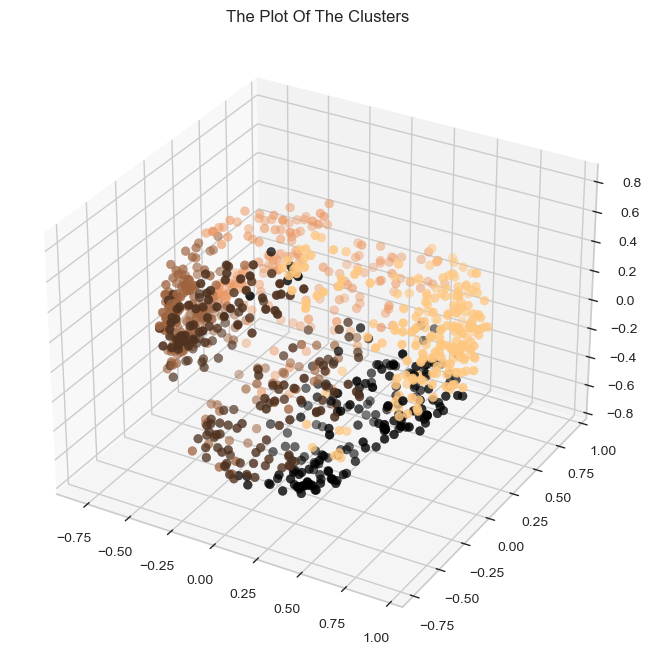

In [755]:
sns.set_style("whitegrid")

#Plotting the clusters
fig = plt.figure(figsize=(10,8))
ax = plt.subplot(111, projection='3d', label="bla")
ax.scatter(x, y, z, s=40, c=kpca_df["Clusters"], cmap="copper", marker='o' )
ax.set_title("The Plot Of The Clusters")
plt.show()

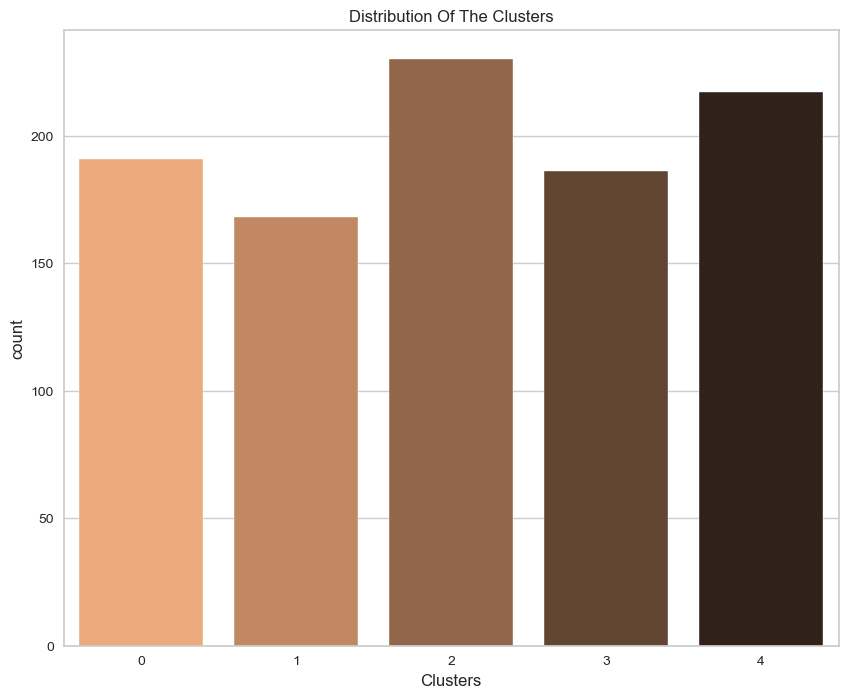

In [756]:
sns.set_style("whitegrid")

fig = plt.figure(figsize=(10,8))
pl = sns.countplot(x=df["Clusters"], palette= "copper_r")
pl.set_title("Distribution Of The Clusters")
plt.show()

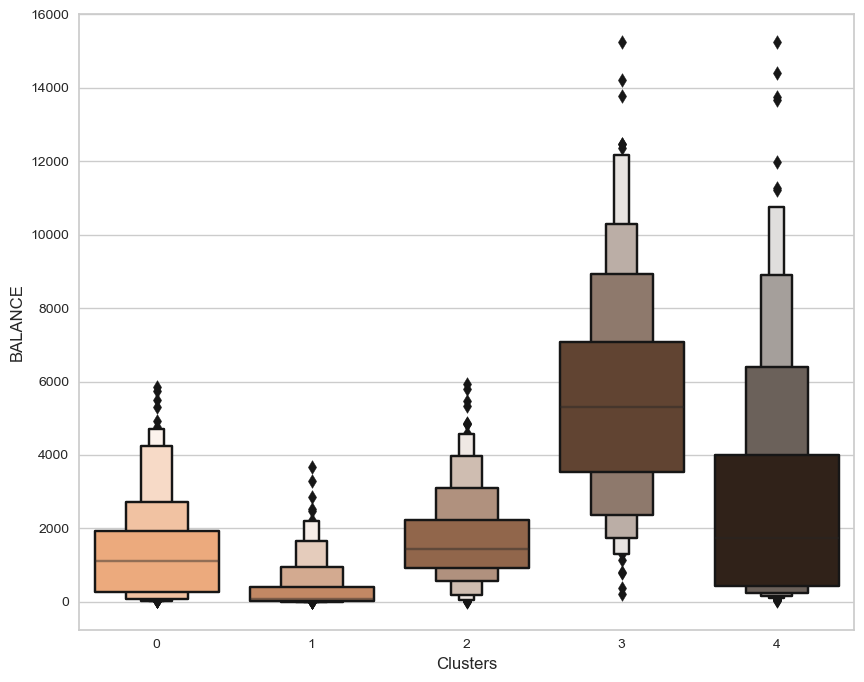

In [757]:
sns.set_style("whitegrid")
fig = plt.figure(figsize=(10,8))
pl=sns.boxenplot(x=df["Clusters"], y=df["BALANCE"], palette="copper_r")
plt.show()

In [794]:
# compute an average silhouette score for each point

silhouette_score_average = silhouette_score(kpca_df, clusters, metric = 'euclidean')
print("Average Silhouette Score", silhouette_score_average)

Average Silhouette Score 0.6349593333514609
